In [1]:
# ! pip install ultralytics

In [2]:
import cv2
import os
import glob
import numpy as np
import shutil
import random
from pathlib import Path
from imutils import rotate_bound
from ultralytics import YOLO
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, auc
from sklearn.metrics import classification_report
import seaborn as sns
%matplotlib inline

In [4]:
# Load Models
seg_model = YOLO('./resources/id_seg_best.pt')
rot_model = YOLO('./resources/rot_cls_best.pt')
front_lines_model = YOLO('./resources/front_line_det_best.pt')
back_lines_model = YOLO('./resources/back_line_det_best.pt')

# ID Card Segementation Model

Data used for card segmentationg model:
- Train: 6179
- validation: 166
- test: 74

Source: https://universe.roboflow.com/mo-1q5np/card_finder-ykuhs/dataset/2

## Training

In [5]:
# Un-comment to start model training

# model = YOLO('./yolo_models/yolo11n-seg.pt')
# model.train(data='./data/Card_Segmentation_data/Exp2/data.yaml', epochs=100, imgsz=640, patience=10)

## Testing and Evaluation

In [5]:
# Load the model
seg_model = YOLO('./resources/id_seg_best.pt')

seg_test_imgs = glob.glob('./data/Card_Segmentation_data/Exp2/test/images/*.jpg')
seg_test_lebels = glob.glob('./data/Card_Segmentation_data/Exp2/test/labels/*.txt')
len(seg_test_imgs), len(seg_test_lebels)

(74, 74)

### Helper functions for testing and evaluation

In [6]:
def visualize_prediction(img_path, model):
    results = model(img_path, verbose=False)

    plt.figure(figsize=(12, 8))

    mask = results[0].masks[0].data[0].cpu().numpy()
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    color_overlay = np.full_like(img[mask > 0.5], [255, 0, 0], dtype=np.uint8)
    img[mask > 0.5] = cv2.addWeighted(img[mask > 0.5], 0.5, color_overlay, 0.5, 0)

    if results[0].boxes:
        box = results[0].boxes.xyxy[0].cpu().numpy()
        cv2.rectangle(img, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 255, 0), 2)

    plt.imshow(img)
    plt.title(f"Conf: {results[0].boxes.conf[0]:.2f}")
    plt.axis('off')
    plt.show();


In [7]:
def get_gt_mask(image_path, label_folder, return_boxes=False):
    """
    Convert YOLO polygon annotations to binary masks.

    Args:
        image_path: Path to the image file
        label_folder: Folder containing YOLO .txt annotations
        return_boxes: If True, returns bounding boxes alongside masks

    Returns:
        gt_masks: List of binary masks (0/1 numpy arrays)
        gt_boxes: [Optional] List of [x1,y1,x2,y2] bounding boxes
    """
    # Load image dimensions
    img = cv2.imread(image_path)
    h, w = img.shape[:2]

    # Get corresponding label file
    label_path = os.path.join(label_folder, os.path.basename(image_path).replace('.jpg', '.txt'))

    gt_masks = []
    gt_boxes = []

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f.readlines():
                parts = list(map(float, line.strip().split()))
                class_id = int(parts[0])
                polygon = parts[1:]  # Normalized [x1,y1,x2,y2,...]

                # Convert polygon to mask
                polygon = np.array(polygon).reshape(-1, 2)
                polygon[:, 0] *= w  # Denormalize x
                polygon[:, 1] *= h  # Denormalize y
                polygon = polygon.astype(np.int32)

                mask = np.zeros((h, w), dtype=np.uint8)
                cv2.fillPoly(mask, [polygon], 1)
                gt_masks.append(mask)

                if return_boxes:
                    x1, y1 = polygon.min(axis=0)
                    x2, y2 = polygon.max(axis=0)
                    gt_boxes.append([x1, y1, x2, y2])

    if return_boxes:
        return gt_masks, gt_boxes
    return gt_masks


In [8]:
def calculate_segmentation_metrics(pred_masks, pred_scores, pred_classes,
                                 gt_masks, gt_classes, iou_threshold=0.5):
    """
    Calculate precision, recall, and AP for instance segmentation.

    Args:
        pred_masks: List of predicted binary masks (0/1 arrays)
        pred_scores: List of confidence scores for each prediction
        pred_classes: List of predicted class IDs
        gt_masks: List of ground truth binary masks
        gt_classes: List of ground truth class IDs
        iou_threshold: IoU threshold for TP/FP classification

    Returns:
        precision, recall, ap
    """
    # Initialize counters
    tp_list = []
    fp_list = []
    gt_matched = [False] * len(gt_masks)

    # Sort predictions by confidence (descending)
    pred_scores = np.array(pred_scores)
    sorted_indices = np.argsort(pred_scores)[::-1]

    # Reorder using the sorted indices
    pred_masks = [pred_masks[i] for i in sorted_indices]
    pred_classes = [pred_classes[i] for i in sorted_indices]

    for pred_mask, pred_class in zip(pred_masks, pred_classes):
        best_iou = 0
        best_gt_idx = -1

        # Find best matching GT
        for gt_idx, (gt_mask, gt_class) in enumerate(zip(gt_masks, gt_classes)):
            # Check if the ground truth has already been matched
            if gt_matched[gt_idx] or pred_class != gt_class:
                continue

            # Calculate IoU
            intersection = np.sum(np.logical_and(pred_mask, gt_mask))
            union = np.sum(np.logical_or(pred_mask, gt_mask))
            iou = intersection / (union + 1e-7)

            if iou > best_iou:
                best_iou = iou
                best_gt_idx = gt_idx

        # Classify as TP or FP
        if best_iou >= iou_threshold and best_gt_idx != -1:
            tp_list.append(1)
            fp_list.append(0)
            gt_matched[best_gt_idx] = True
        else:
            tp_list.append(0)
            fp_list.append(1)

    # Calculate cumulative TP/FP
    tp_cumsum = np.cumsum(tp_list)
    fp_cumsum = np.cumsum(fp_list)

    # Precision and recall
    # Avoid division by zero if no predictions were made
    precision = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-7) if (tp_cumsum + fp_cumsum).sum() > 0 else np.array([0])
    recall = tp_cumsum / (len(gt_masks) + 1e-7) if len(gt_masks) > 0 else np.array([0])


    # Average Precision (area under P-R curve)
    # Need at least two points to calculate AUC
    if len(recall) > 1 and len(precision) > 1:
        ap = auc(recall, precision)
    else:
        ap = 0.0 # Or handle as appropriate if not enough points for AUC


    return precision[-1] if precision.size > 0 else 0, recall[-1] if recall.size > 0 else 0, ap

In [13]:
def polygon_to_mask(polygon, image_shape):
    """
    Convert a polygon (list of x,y points) to a binary mask.

    """
    # Denormalize coordinates
    height, width = image_shape
    polygon = np.array(polygon).reshape(-1, 2)
    polygon[:, 0] *= width
    polygon[:, 1] *= height
    polygon = polygon.astype(np.int32)

    # Create mask
    mask = np.zeros(image_shape, dtype=np.uint8)
    cv2.fillPoly(mask, [polygon], 1)
    return mask

def calculate_iou(mask_pred, polygon_true, img_shape):
    """
    Compute IoU between a predicted mask and a ground truth polygon.
    """
    # Convert polygon to mask
    mask_true = polygon_to_mask(polygon_true, img_shape)

    # Calculate IoU
    intersection = np.logical_and(mask_pred, mask_true).sum()
    union = np.logical_or(mask_pred, mask_true).sum()
    return intersection / (union + 1e-7)

def process_yolo_results(results):
    pred_masks_all = [(m.data[0].cpu().numpy() > 0.5).astype(np.uint8)
                      for m in results.masks]
    pred_scores_all = results.boxes.conf.cpu().numpy()
    pred_classes_all = results.boxes.cls.cpu().numpy().astype(int)

    # If there are multiple predictions, select the one with the highest score
    if len(pred_scores_all) > 0:
        best_idx = np.argmax(pred_scores_all)
        pred_masks = [pred_masks_all[best_idx]]
        pred_scores = [pred_scores_all[best_idx]]
        pred_classes = [pred_classes_all[best_idx]]
    else:
        pred_masks ,pred_scores, pred_classes = [], [] , []

    return pred_masks, pred_scores, pred_classes

### Predictions Visualization 

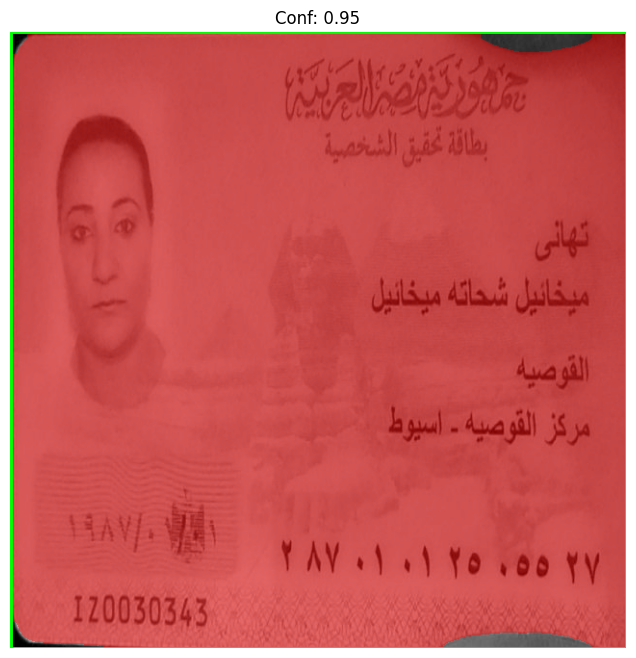

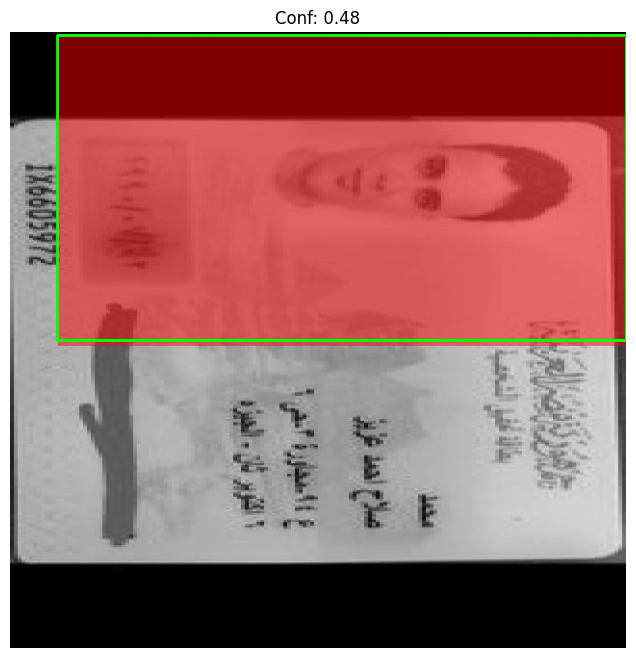

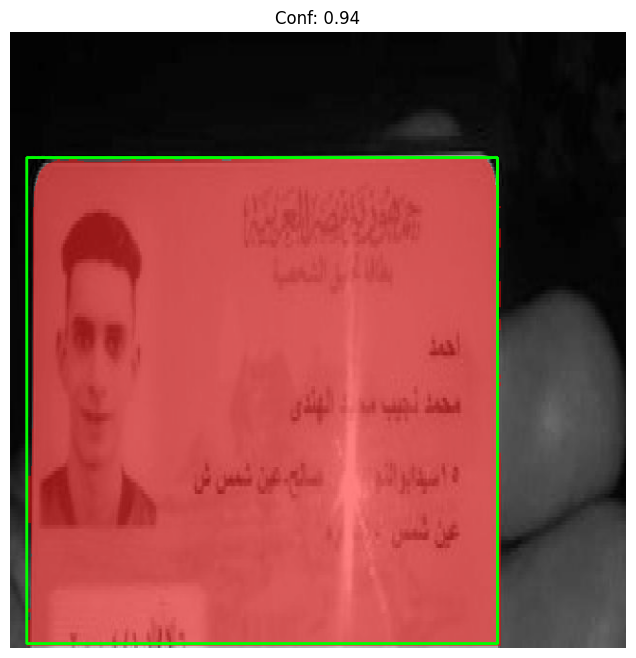

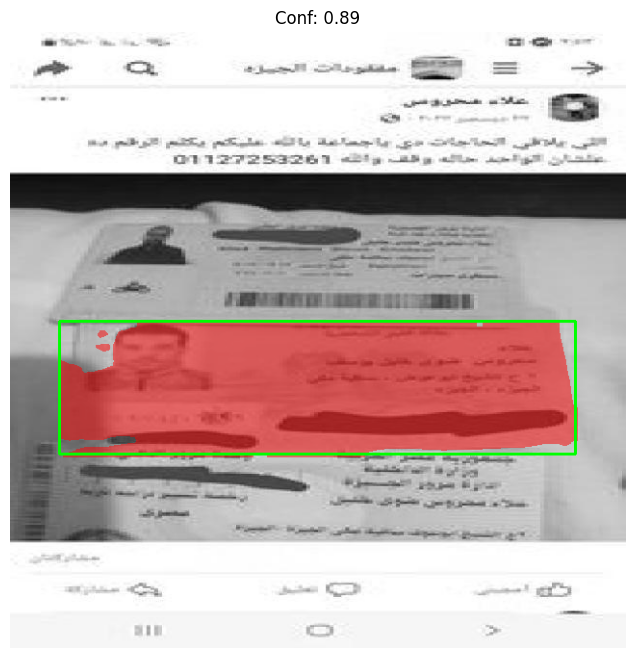

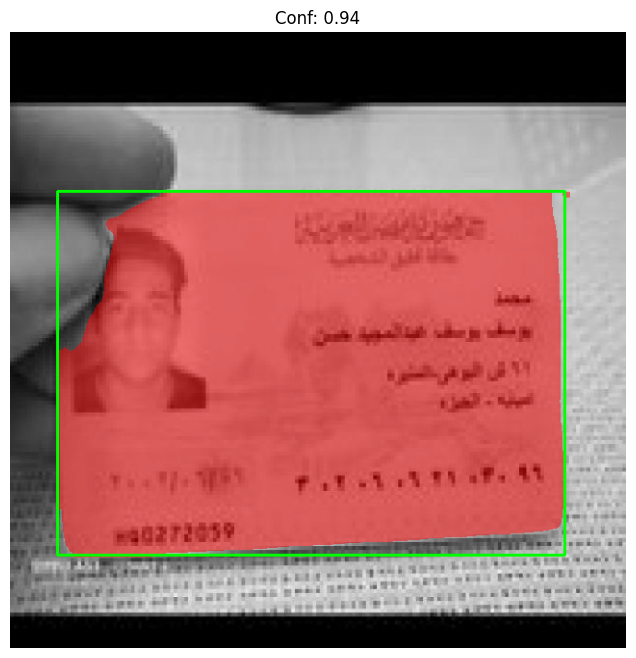

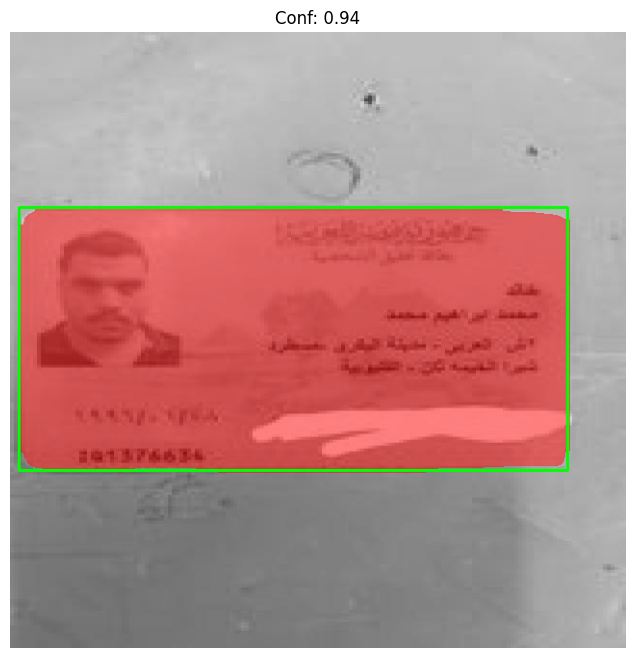

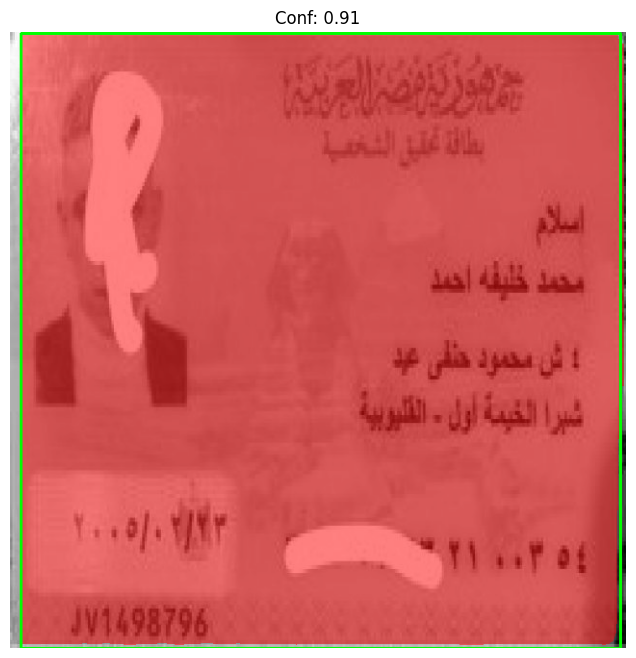

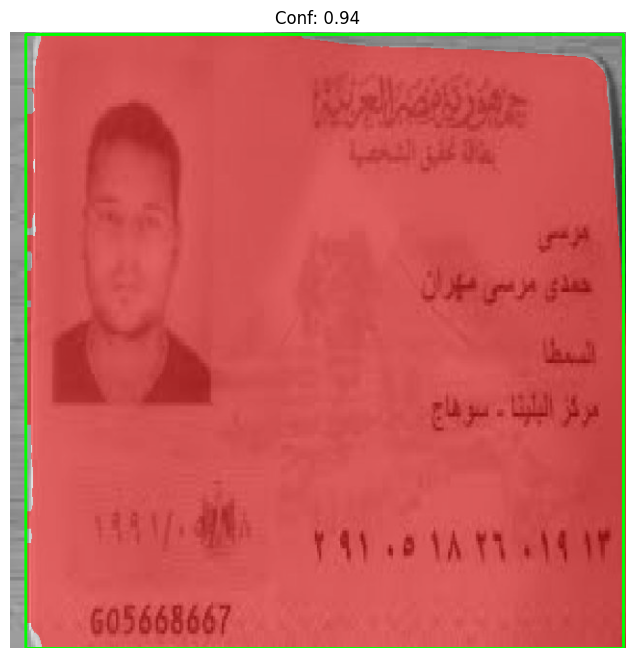

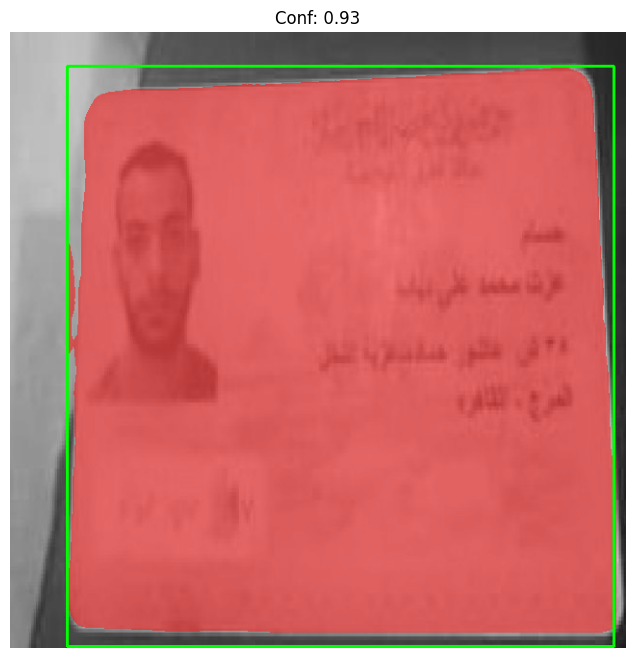

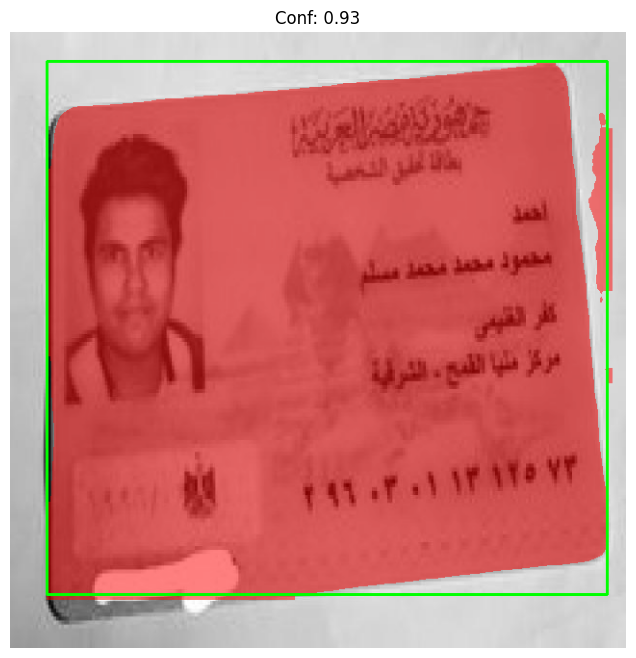

In [10]:
# visualize first 10 test images
for img_path in seg_test_imgs[:10]:
  visualize_prediction(img_path, seg_model)

### Get test predictions

In [15]:
# get predictions of all images in test set
test_labels_folder = "./data/Card_Segmentation_data/Exp2/test/labels"
pred_masks_all_imgs, pred_scores_all_imgs, pred_classes_all_imgs, gt_masks_all_imgs = [], [], [], []

for img_path in seg_test_imgs:

    results = seg_model(img_path, verbose=False)

    pred_mask_img, pred_score_img, pred_class_img = process_yolo_results(results[0])
    gt_mask_img = get_gt_mask(img_path, test_labels_folder)

    # Extend the lists for all images
    pred_masks_all_imgs.extend(pred_mask_img)
    pred_scores_all_imgs.extend(pred_score_img)
    pred_classes_all_imgs.extend(pred_class_img)
    gt_masks_all_imgs.extend(gt_mask_img)

### Evaluation metrics

In [16]:
# all ground truth masks are of class 0 for this dataset
gt_classes_all_imgs = [0] * len(gt_masks_all_imgs) # Create a list of class 0 for each GT mask

precision, recall, ap = calculate_segmentation_metrics(
    pred_masks_all_imgs, pred_scores_all_imgs, pred_classes_all_imgs,
    gt_masks_all_imgs, gt_classes_all_imgs, iou_threshold=0.5)

print(f"Precision: {precision:.3f} \nRecall: {recall:.3f} \nAP@50: {ap:.3f}")

Precision: 0.986 
Recall: 0.973 
AP@50: 0.960


In [17]:
confidence_threshold = 0.5

IoUs = []
for img_path in seg_test_imgs:

    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # Run prediction
    results = seg_model(img_path)
    if not results[0].masks:
        continue

    # Get predicted mask and box
    pred_mask = (results[0].masks[0].data[0].cpu().numpy() > confidence_threshold).astype(np.uint8)
    pred_mask = cv2.resize(pred_mask, (w, h))
    box = results[0].boxes.xyxy[0].cpu().numpy()  # [x1,y1,x2,y2]
    label_path = "./data/Card_Segmentation_data/Exp2/test/labels/"+ os.path.basename(img_path).replace(".jpg", ".txt")
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:

            line = f.read().strip().split()
            polygon_coords_flat = list(map(float, line[1:]))

            # Check if the number of coordinates is even
            if len(polygon_coords_flat) % 2 == 0 and len(polygon_coords_flat) > 0:
                polygon_coords = [(polygon_coords_flat[i], polygon_coords_flat[i+1]) for i in range(0, len(polygon_coords_flat), 2)]
                iou = calculate_iou(pred_mask, polygon_coords, (h, w))
                IoUs.append(iou)
                
print(f"Mean IoU: {round(np.mean(IoUs), 3)}")


Mean IoU: 0.935


##  ID card cropping & adjust card prespective.

In [18]:
def order_points(pts):

	rect = np.zeros((4, 2), dtype = "float32")
	s = pts.sum(axis = 1)

	rect[0] = pts[np.argmin(s)]
	rect[2] = pts[np.argmax(s)]

	diff = np.diff(pts, axis = 1)
	rect[1] = pts[np.argmin(diff)]
	rect[3] = pts[np.argmax(diff)]
	# return the ordered coordinates
	return rect


def adjust_perspective(image, pts):

    # obtain a consistent order of the points and unpack them individually
    rect = order_points(pts)
    (tl, tr, br, bl) = rect
    
    # compute the width of the new image, which will be the
    # maximum distance between bottom-right and bottom-left
    # x-coordiates or the top-right and top-left x-coordinates
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))

    # compute the height of the new image, which will be the
    # maximum distance between the top-right and bottom-right
    # y-coordinates or the top-left and bottom-left y-coordinates
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))

    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype = "float32")

    # compute the perspective transform matrix and then apply it
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))

    return warped

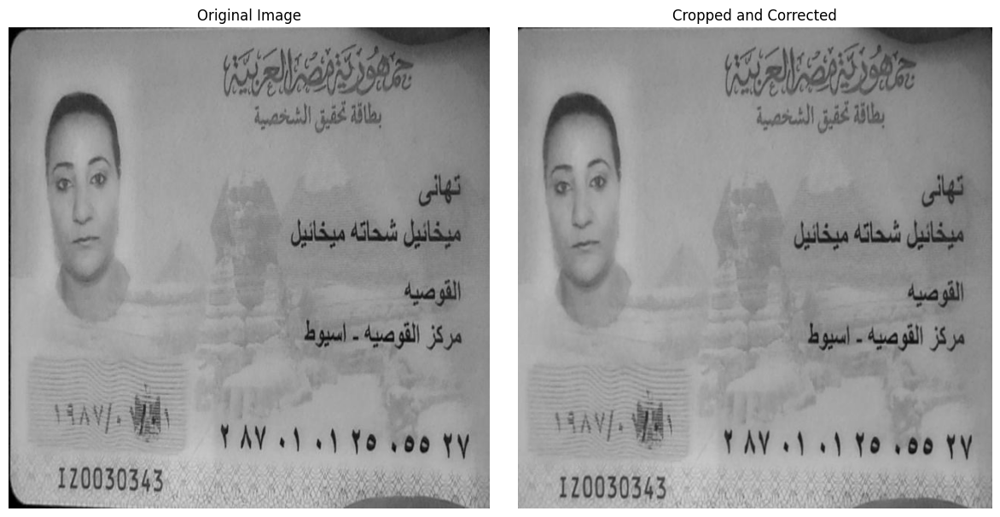

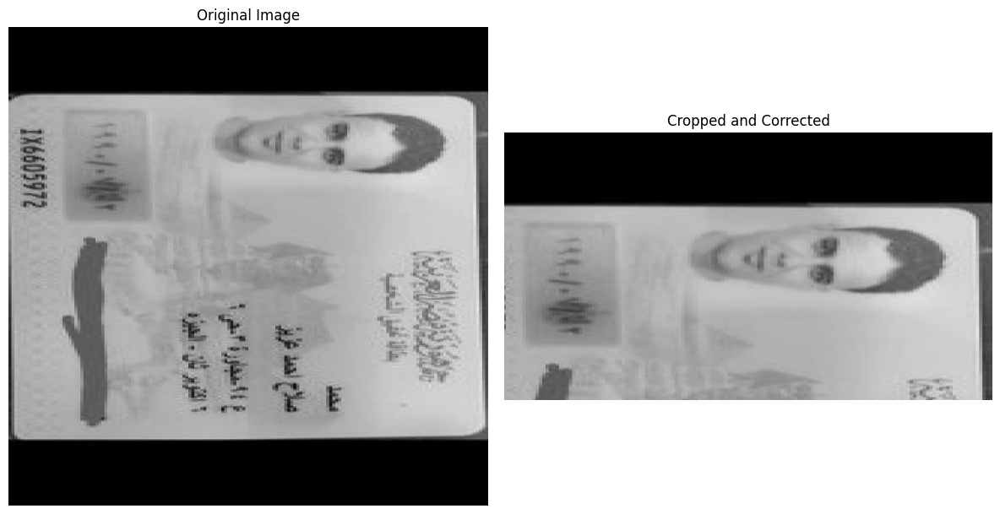

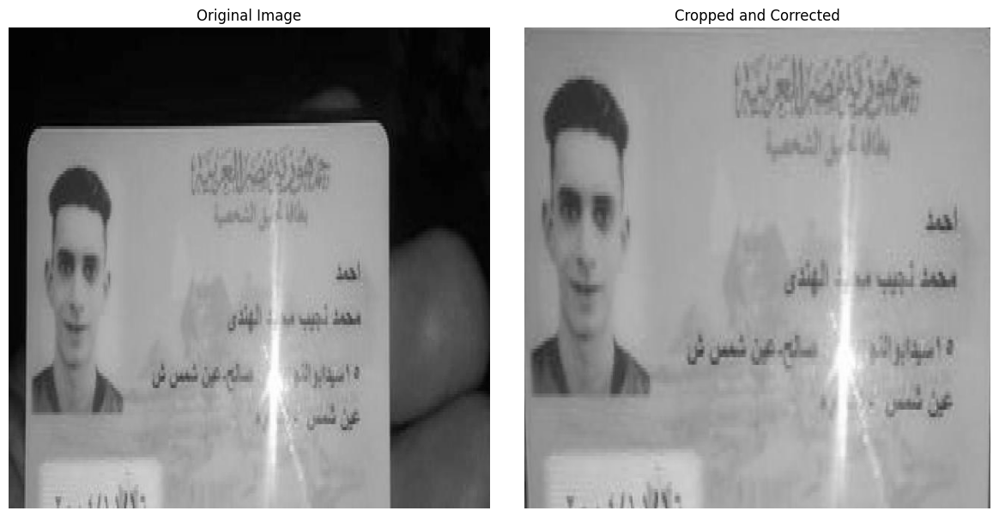

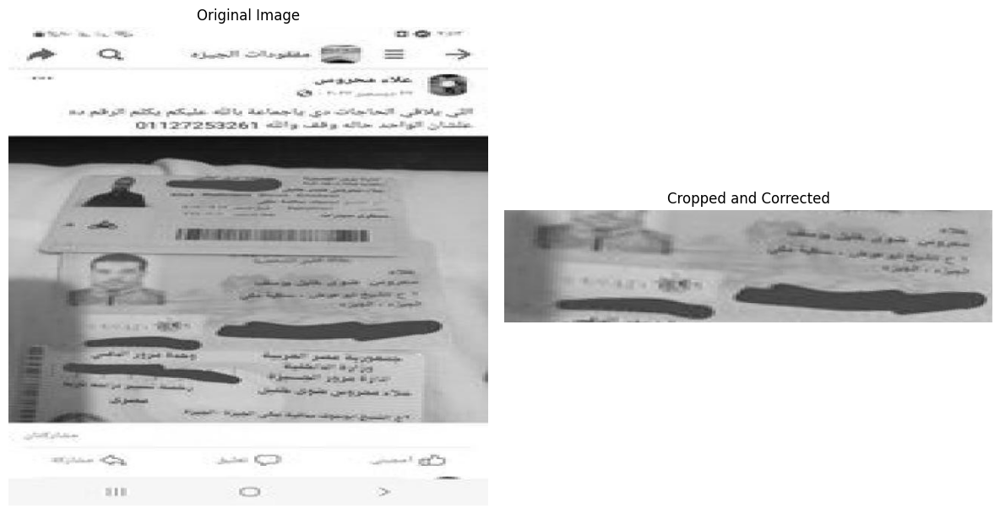

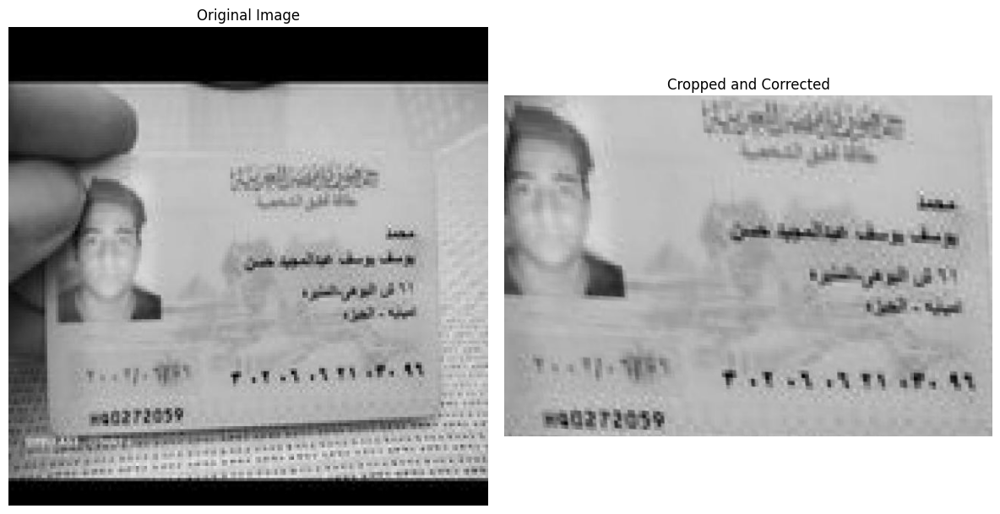

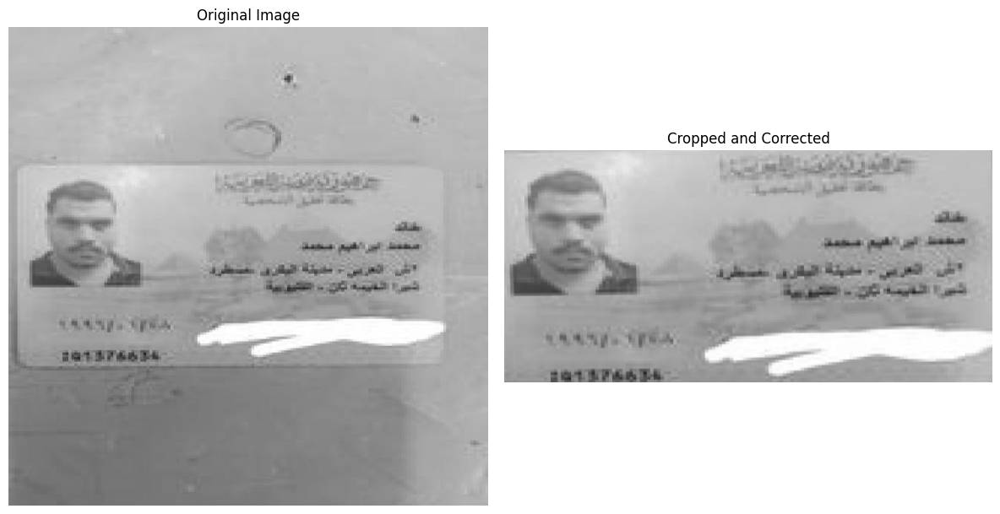

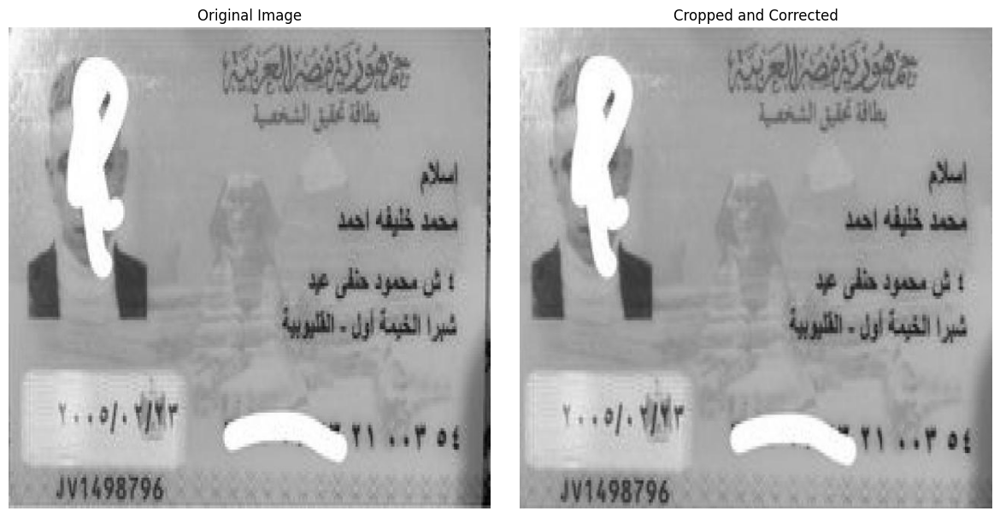

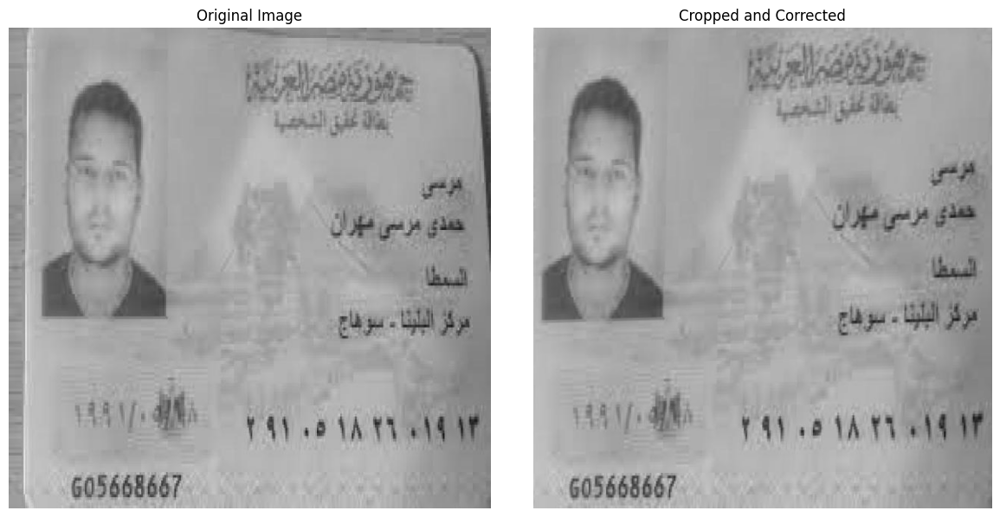

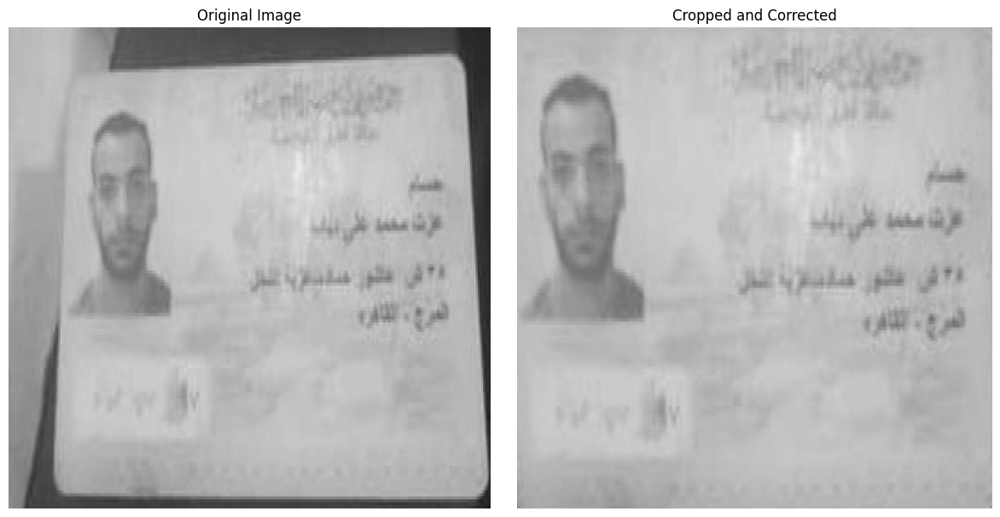

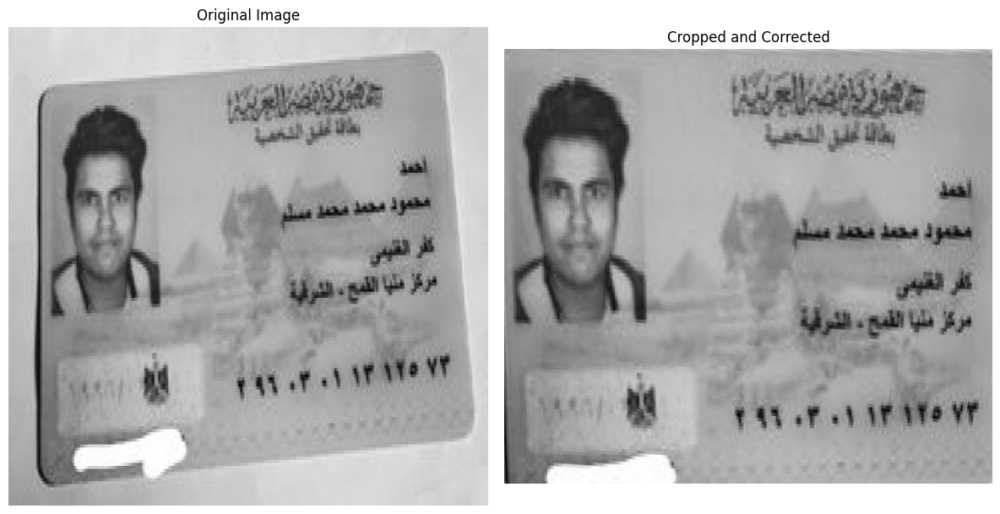

In [19]:
for path in seg_test_imgs[:10]:
    
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    pred = seg_model(img)
    # Ensure there is a mask prediction before proceeding
    if pred and pred[0].masks:
        pred_polygon = pred[0].masks.xy[0]
        corrected = adjust_perspective(img, pred_polygon)

        # Display original and corrected images side-by-side
        plt.figure(figsize=(12, 6))

        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(corrected)
        plt.title("Cropped and Corrected")
        plt.axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print(f"No mask prediction found for image: {path}")

# Card Rotation (Alignment) Correction Model

Description:
  A classification model trained to classify 4 classes to correct 180 degree rotated cases:       
* 0: '0_correct_front' (train: 25, val:10, test:5)
* 1: '1_180_front' (train: 25, val:10,  test:5)
* 2: '2_correct_back' (train: 25, val:10,  test:5)
* 3: '3_180_back' (train: 25, val:10,  test:5)

The dataset used to train this model was constructed using a function to create different rotation cases of the front & the back of the ENID.


## Create dataset (rotation cases)


`create_rotated_dataset()` function to create 180 degree rotated IDs from original images and create folder for each class.

In [20]:
def create_rotated_dataset(original_front_dir, original_back_dir, output_dir):
    """
    create 4 folders for each class and create 180 degree rotated cases from front & back of the id.
        - '0_correct_front',
        - '1_180_front',
        - '2_correct_back',
        - '3_180_back'
    """
    
    # Define class directories
    class_dirs = {
        0: '0_correct_front',
        1: '1_180_front',
        2: '2_correct_back',
        3: '3_180_back'
    }

    # Create output directories
    for class_dir in class_dirs.values():
        os.makedirs(os.path.join(output_dir, class_dir), exist_ok=True)

    # Process front images
    for img_name in os.listdir(original_front_dir):
        img_path = os.path.join(original_front_dir, img_name)
        if not os.path.isfile(img_path):
            continue

        # Read image
        img = cv2.imread(img_path)
        if img is None:
            continue

        # Save original front (class 0)
        output_path = os.path.join(output_dir, class_dirs[0], img_name)
        cv2.imwrite(output_path, img)

        # Create and save 180° rotated front (class 1)
        rotated = rotate_bound(img, 180)
        rotated_name = f"rot180_{img_name}"
        output_path = os.path.join(output_dir, class_dirs[1], rotated_name)
        cv2.imwrite(output_path, rotated)

    # Process back images
    for img_name in os.listdir(original_back_dir):
        img_path = os.path.join(original_back_dir, img_name)
        if not os.path.isfile(img_path):
            continue

        # Read image
        img = cv2.imread(img_path)
        if img is None:
            continue

        # Save original back (class 2)
        output_path = os.path.join(output_dir, class_dirs[2], img_name)
        cv2.imwrite(output_path, img)

        # Create and save 180° rotated back (class 3)
        rotated = rotate_bound(img, 180)
        rotated_name = f"rot180_{img_name}"
        output_path = os.path.join(output_dir, class_dirs[3], rotated_name)
        cv2.imwrite(output_path, rotated)


In [21]:
original_front_dir = './data/aligment_correction_data/original/front'
original_back_dir = './data/aligment_correction_data/original/back'
output_dir = './data/aligment_correction_data/rotated'

create_rotated_dataset(original_front_dir, original_back_dir, output_dir)

In [65]:
output_dir = './data/aligment_correction_data/rotated'

# List all entries in the folder_path
for entry_name in os.listdir(output_dir):
    entry_path = os.path.join(output_dir, entry_name)

    # Check if the entry is a directory
    if os.path.isdir(entry_path):
        # Count image files (jpg, jpeg, png) in the child directory
        image_count = len(glob.glob(os.path.join(entry_path, '*.jpg'))) + \
                      len(glob.glob(os.path.join(entry_path, '*.jpeg'))) + \
                      len(glob.glob(os.path.join(entry_path, '*.png')))

        print(f"  '{entry_name}': {image_count} images")

  '0_correct_front': 40 images
  '1_180_front': 40 images
  '2_correct_back': 40 images
  '3_180_back': 40 images


## Split data

* 0_correct_front (train: 25, val:10, test:5)
* 1_180_front (train: 25, val:10, test:5)
* 2_correct_back (train: 25, val:10, test:5)
* 3_180_back (train: 25, val:10, test:5)

In [66]:
source_dir = Path("./data/aligment_correction_data/rotated")
dest_dir = Path("./data/aligment_correction_data/rotated_split")

# Create destination folders
(dest_dir / "train").mkdir(parents=True, exist_ok=True)
(dest_dir / "val").mkdir(exist_ok=True)
(dest_dir / "test").mkdir(exist_ok=True)

classes = ["0_correct_front", "1_180_front", "2_correct_back", "3_180_back"]

for cls in classes:
    class_path = source_dir / cls
    images = list(class_path.glob("*.[jp][pn]g"))

    # Shuffle and split
    random.shuffle(images)
    train = images[:25]
    val = images[25:35]
    test = images[35:40]

    # Create class subdirectories in each split
    (dest_dir / "train" / cls).mkdir(exist_ok=True)
    (dest_dir / "val" / cls).mkdir(exist_ok=True)
    (dest_dir / "test" / cls).mkdir(exist_ok=True)

    # Copy files
    def copy_split(files, split):
        for img in files:
            shutil.copy(img, dest_dir / split / cls / img.name)

    copy_split(train, "train")
    copy_split(val, "val")
    copy_split(test, "test")

for cls in classes:
    print(f"\n{cls}:")
    print(f"  Train: {len(list((dest_dir / 'train' / cls).glob('*')))}")
    print(f"  Val: {len(list((dest_dir / 'val' / cls).glob('*')))}")
    print(f"  Test: {len(list((dest_dir / 'test' / cls).glob('*')))}")


0_correct_front:
  Train: 25
  Val: 10
  Test: 5

1_180_front:
  Train: 25
  Val: 10
  Test: 5

2_correct_back:
  Train: 25
  Val: 10
  Test: 5

3_180_back:
  Train: 25
  Val: 10
  Test: 5


## Training

In [ ]:
# Un-comment to start training the model
# model = YOLO("./yolo_models/yolo11n-cls.pt")
# rot_model = model.train(data="./data/aligment_correction_data/rotated_split", epochs=50, imgsz=640, patience=10)

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/tasks/data/aligment_correction_data/rotated_split, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train8, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, pe

train: Scanning /content/drive/MyDrive/tasks/data/aligment_correction_data/rotated_split/train... 100 images, 0 corrupt: 100%|██████████| 100/100 [00:00<00:00, 187.23it/s]


train: New cache created: /content/drive/MyDrive/tasks/data/aligment_correction_data/rotated_split/train.cache
val: Fast image access ✅ (ping: 1.2±1.1 ms, read: 27.9±22.6 MB/s, size: 87.8 KB)


val: Scanning /content/drive/MyDrive/tasks/data/aligment_correction_data/rotated_split/val... 40 images, 0 corrupt: 100%|██████████| 40/40 [00:00<00:00, 115.85it/s]

val: New cache created: /content/drive/MyDrive/tasks/data/aligment_correction_data/rotated_split/val.cache


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 39 weight(decay=0.0), 40 weight(decay=0.0005), 40 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/classify/train8
Starting training for 50 epochs...

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00,  4.83it/s]

                   all      0.575          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 10.72it/s]

                   all      0.725          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 14.93it/s]

                   all      0.825          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 16.84it/s]

                   all       0.75          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 11.24it/s]

                   all      0.825          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 18.07it/s]

                   all      0.875          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 13.34it/s]

                   all      0.925          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 11.95it/s]

                   all        0.9          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 24.14it/s]

                   all        0.9          1



      Epoch    GPU_mem       loss  Instances       Size


      10/50      2.13G    0.06434          4        640: 100%|██████████| 7/7 [00:04<00:00,  1.67it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00,  9.37it/s]

                   all      0.925          1



      Epoch    GPU_mem       loss  Instances       Size


      11/50      2.14G    0.08285          4        640: 100%|██████████| 7/7 [00:05<00:00,  1.17it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 11.72it/s]

                   all       0.95          1



      Epoch    GPU_mem       loss  Instances       Size


      12/50      2.15G    0.04308          4        640: 100%|██████████| 7/7 [00:04<00:00,  1.62it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 15.46it/s]

                   all       0.95          1



      Epoch    GPU_mem       loss  Instances       Size


      13/50      2.16G     0.0128          4        640: 100%|██████████| 7/7 [00:04<00:00,  1.66it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00,  8.38it/s]

                   all       0.95          1



      Epoch    GPU_mem       loss  Instances       Size


      14/50      2.17G    0.02433          4        640: 100%|██████████| 7/7 [00:03<00:00,  1.89it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 22.42it/s]

                   all       0.95          1



      Epoch    GPU_mem       loss  Instances       Size


      15/50      2.18G        0.1          4        640: 100%|██████████| 7/7 [00:03<00:00,  2.28it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 23.49it/s]

                   all       0.95          1



      Epoch    GPU_mem       loss  Instances       Size


      16/50      2.19G    0.06302          4        640: 100%|██████████| 7/7 [00:04<00:00,  1.40it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 14.80it/s]

                   all      0.925          1



      Epoch    GPU_mem       loss  Instances       Size


      17/50       2.2G     0.1909          4        640: 100%|██████████| 7/7 [00:03<00:00,  1.98it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 13.47it/s]

                   all       0.95          1



      Epoch    GPU_mem       loss  Instances       Size


      18/50      2.21G    0.04238          4        640: 100%|██████████| 7/7 [00:03<00:00,  1.97it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 21.33it/s]

                   all      0.925          1



      Epoch    GPU_mem       loss  Instances       Size


      19/50      2.21G    0.05261          4        640: 100%|██████████| 7/7 [00:04<00:00,  1.47it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 11.77it/s]

                   all       0.95          1



      Epoch    GPU_mem       loss  Instances       Size


      20/50      2.22G    0.03791          4        640: 100%|██████████| 7/7 [00:04<00:00,  1.56it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 10.30it/s]

                   all       0.95          1



      Epoch    GPU_mem       loss  Instances       Size


      21/50      2.23G    0.09282          4        640: 100%|██████████| 7/7 [00:03<00:00,  1.83it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 13.75it/s]

                   all       0.95          1


EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 11, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

21 epochs completed in 0.031 hours.
Optimizer stripped from runs/classify/train8/weights/last.pt, 3.2MB
Optimizer stripped from runs/classify/train8/weights/best.pt, 3.2MB

Validating runs/classify/train8/weights/best.pt...
Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-cls summary (fused): 47 layers, 1,531,148 parameters, 0 gradients, 3.2 GFLOPs
train: /content/drive/MyDrive/tasks/data/aligment_correction_data/rotated_split/train... found 100 images in 4 classes ✅ 
val: /content/drive/MyDrive/tasks/data/aligment_correction_data/rotated_split/val... found 40 images in 4 classes ✅ 
test: /content/drive/MyDrive/tasks/data/aligment_correction_data/rotated_split/test... fo

               classes   top1_acc   top5_acc: 100%|██████████| 2/2 [00:00<00:00, 10.02it/s]


                   all       0.95          1
Speed: 0.7ms preprocess, 3.0ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs/classify/train8


## Testing and Evaluation

In [22]:
rot_model = YOLO('./resources/rot_cls_best.pt')
test_dir = "./data/aligment_correction_data/rotated_split/test"
class_names = sorted(os.listdir(test_dir))  # Get class names from folder structure

### Get test predictions + Visualization + Evaluation metrics

In [23]:
true_labels = []
pred_labels = []
confidences = []
image_paths = []

# Run Inference on Test Set
for class_idx, class_name in enumerate(class_names):
    class_path = os.path.join(test_dir, class_name)
    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        results = rot_model(img_path, verbose=False)

        true_labels.append(class_idx)
        pred_labels.append(results[0].probs.top1)
        confidences.append(results[0].probs.top1conf.item())
        image_paths.append(img_path)

print("\nClassification Report:")
print(classification_report(true_labels, pred_labels, target_names=class_names))



Classification Report:
                 precision    recall  f1-score   support

0_correct_front       1.00      1.00      1.00         5
    1_180_front       1.00      1.00      1.00         5
 2_correct_back       1.00      1.00      1.00         5
     3_180_back       1.00      1.00      1.00         5

       accuracy                           1.00        20
      macro avg       1.00      1.00      1.00        20
   weighted avg       1.00      1.00      1.00        20



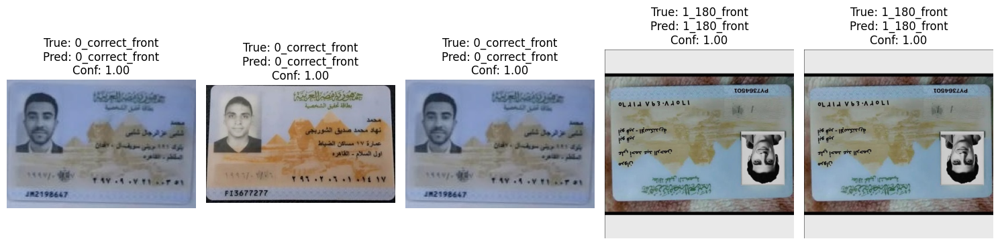

In [24]:
def visualize_predictions(num_samples=5):
    plt.figure(figsize=(15, 10))
    for i in range(num_samples):
        idx = np.random.randint(len(image_paths))
        img = cv2.cvtColor(cv2.imread(image_paths[idx]), cv2.COLOR_BGR2RGB)

        plt.subplot(2, num_samples, i+1)
        plt.imshow(img)
        plt.title(f"True: {class_names[true_labels[idx]]}\nPred: {class_names[pred_labels[idx]]}\nConf: {confidences[idx]:.2f}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

visualize_predictions()

## Correct Rotation

In [25]:
def correct_180_rotation(image, rot_model):
    class_names = {
        0: '0_correct_front',
        1: '1_180_front',
        2: '2_correct_back',
        3: '3_180_back'}

    pred = rot_model(image, verbose=False)
    top1_index = pred[0].probs.top1
    class_name = class_names[top1_index]

    if class_name in ['1_180_front', '3_180_back']:
        return cv2.rotate(image, cv2.ROTATE_180)
    else:
        return image


### Visualise data after 180 degree rotation correction

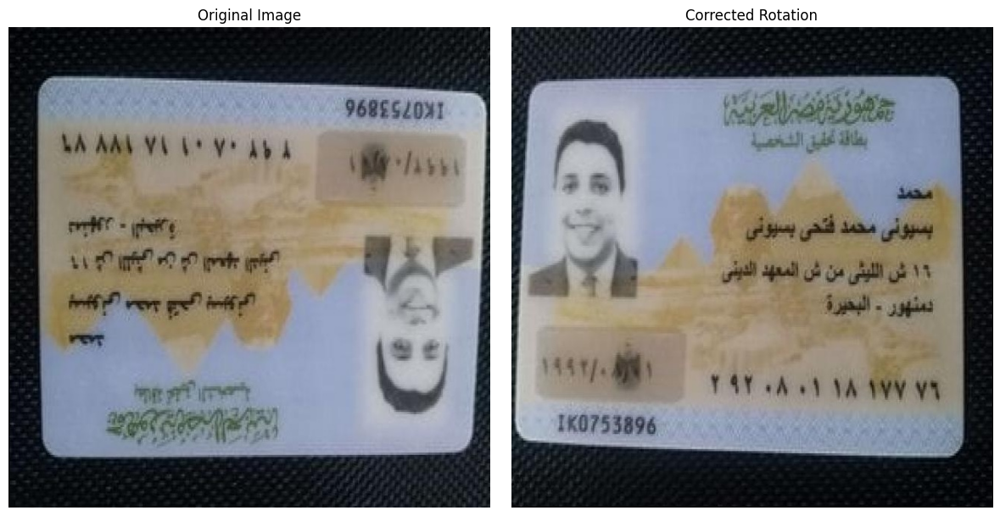

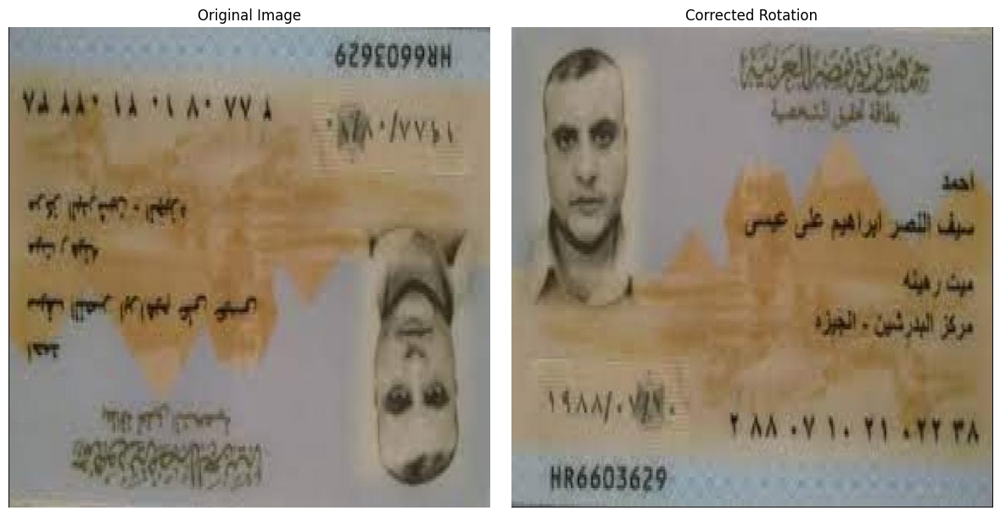

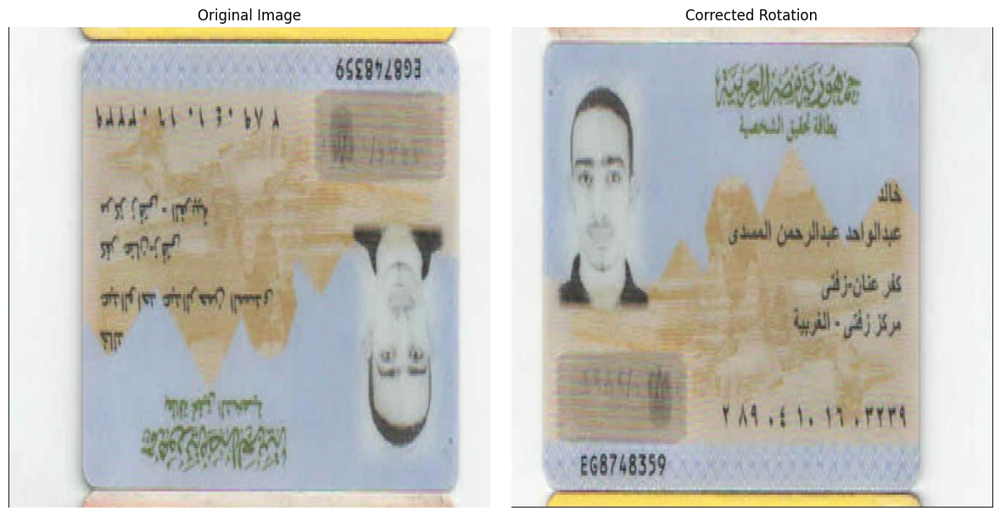

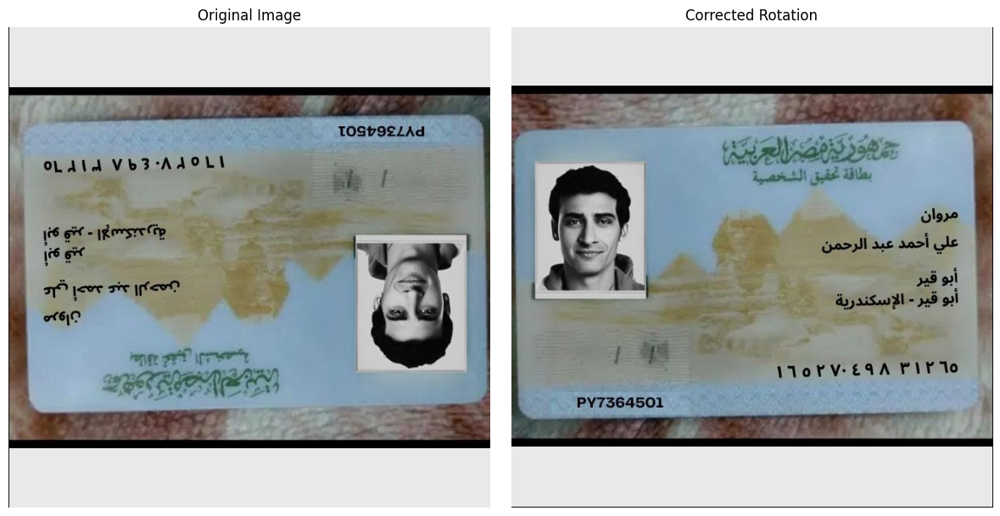

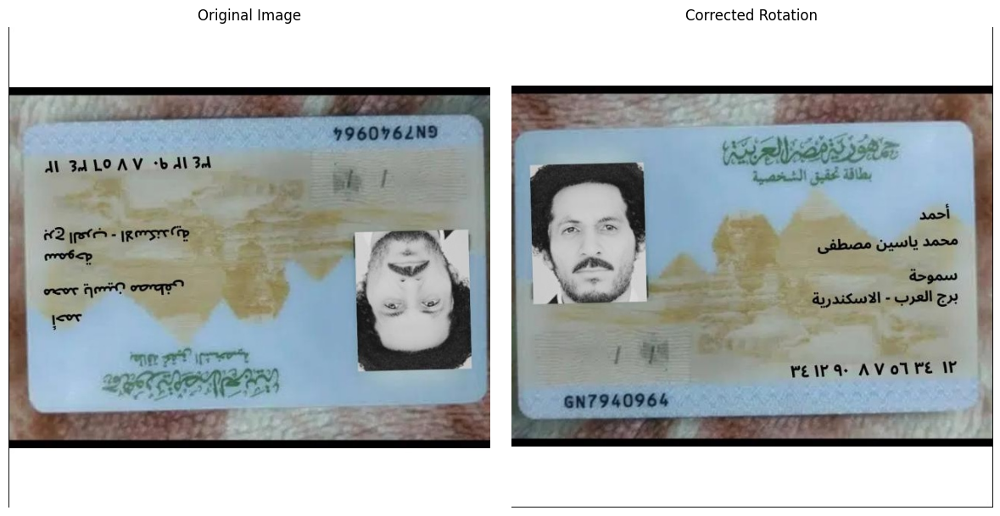

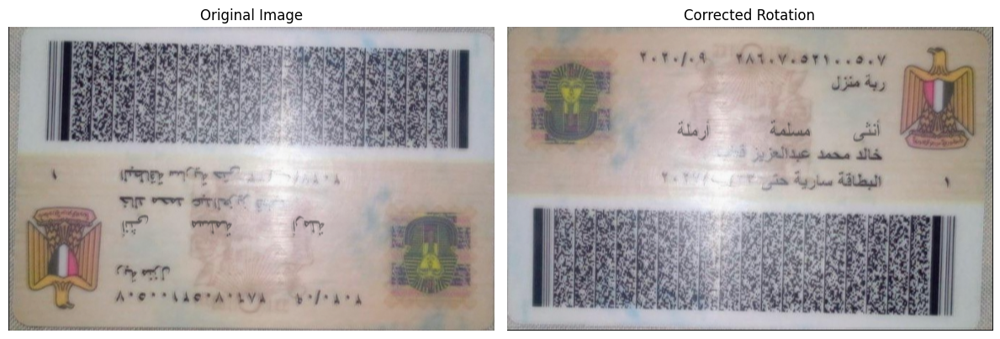

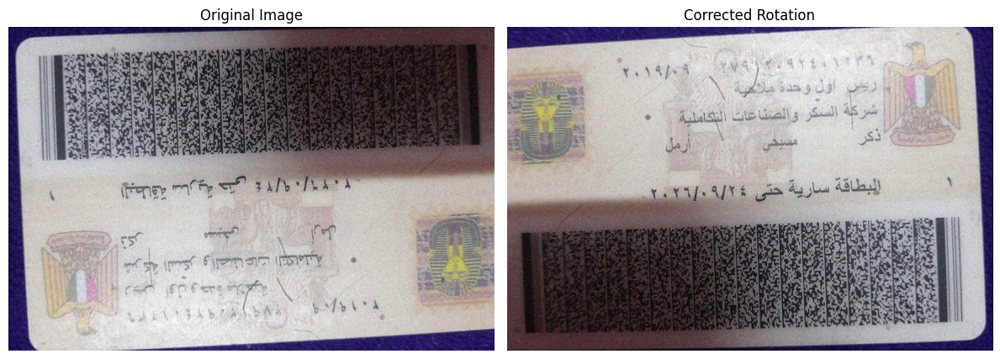

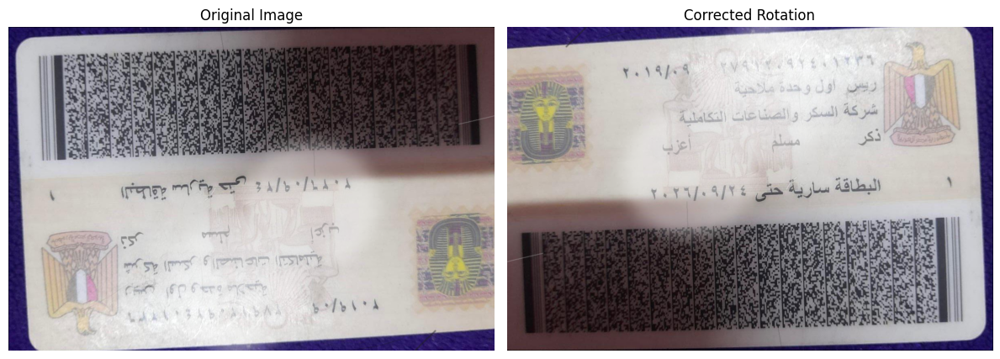

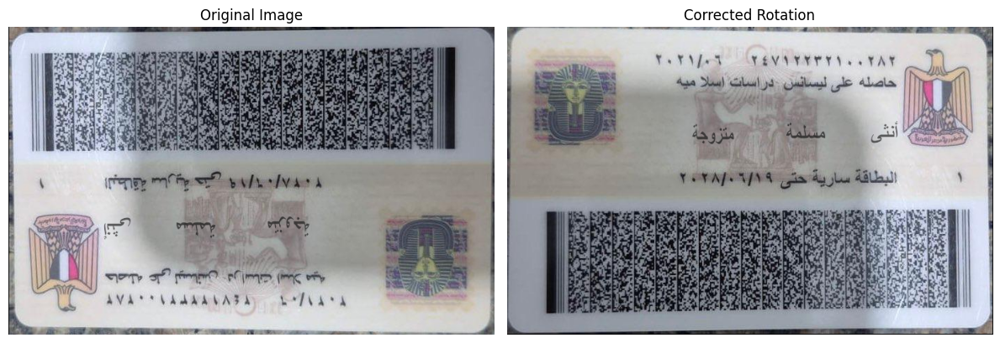

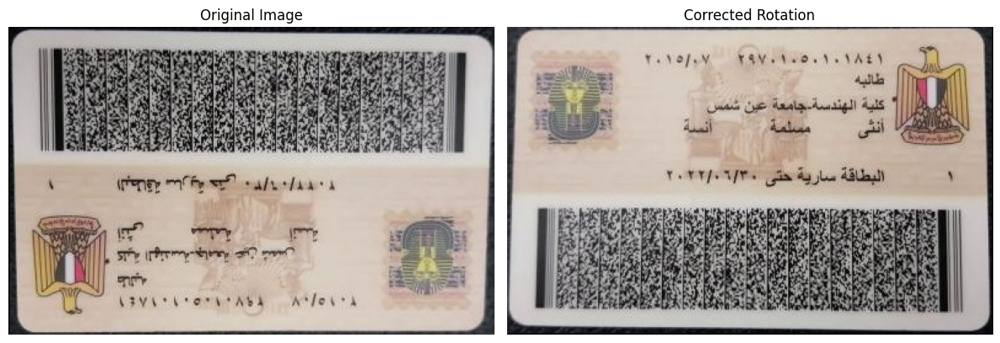

In [26]:
rotated_images = glob.glob('./data/aligment_correction_data/rotated_split/test/1_180_front/*') +\
                glob.glob('./data/aligment_correction_data/rotated_split/test/3_180_back/*')

for img_path in rotated_images:
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    try:
        corrected = correct_180_rotation(img, rot_model)
    except:
        continue
    # Display original and corrected images side-by-side
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(corrected)
    plt.title("Corrected Rotation")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Front ID Text Lines Detection

Data used for front ID lines detection model:
- Train: 589
- validation: 65
- Test: 35

Each label file contains 7 classes:
* 0: 'Code'
* 1: 'city'
* 2: 'family name'
* 3: 'name'
* 4: 'neighborhood'
* 5: 'number'
* 6: 'state'


Source: https://universe.roboflow.com/object-detection-in-shelf-images-with-yolo/egyptian-id-seg-hhm4j/dataset/4

## Training 

In [80]:
# Un-comment to start training the model

# front_lines_model = YOLO('./yolo_models/yolo11n.pt')
# front_lines_model.train(data='./data/Line_Detection_data/back/data.yaml', epochs=100, imgsz=640)

## Testing & Evaluation

In [27]:
# Load the model
front_lines_model = YOLO('./resources/front_line_det_best.pt')

### Calculate Metrics

In [28]:
class_names = ['Code', 'city', 'family name', 'name', 'neighborhood', 'number', 'state']

metrics = front_lines_model.val(
    data="./data/Line_Detection_data/front/data.yaml",
    split="test",
    iou=0.)

print("\n----------------------------------------------------------------------------------")
print(f"mAP@50: {float(metrics.box.map50):.4f}")        # mAP at IoU=0.5
print(f"mAP@50-95: {float(metrics.box.map):.4f}")       # Average mAP over IoU 0.5-0.95

print(f"Mean Precision: {float(metrics.box.p.mean()):.4f}")  # Average precision
print(f"Mean Recall: {float(metrics.box.r.mean()):.4f}")     # Average recall

# Per-class metrics
print("\nPer-class mAP@50:")
for i, name in enumerate(front_lines_model.names.values()):
    print(f"{name}: {float(metrics.box.ap50[i]):.4f}")


Ultralytics 8.3.161  Python-3.12.1 torch-2.4.1+cpu CPU (11th Gen Intel Core(TM) i7-1165G7 2.80GHz)
YOLO11n summary (fused): 100 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access  (ping: 0.30.1 ms, read: 106.741.4 MB/s, size: 68.7 KB)


val: Scanning C:\Users\aosayed\Music\Tasks\Final_ENIDs\Final\data\Line_Detection_data\front\test\labels... 35 images, 0

val: New cache created: C:\Users\aosayed\Music\Tasks\Final_ENIDs\Final\data\Line_Detection_data\front\test\labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<0


                   all         35        245      0.983      0.992      0.985      0.749
                  Code         35         35      0.933      0.943      0.928      0.706
                  city         35         35      0.988          1      0.995      0.768
           family name         35         35      0.998          1      0.995      0.792
                  name         35         35      0.989          1      0.995      0.677
          neighborhood         35         35      0.989          1      0.995      0.776
                number         35         35      0.998          1      0.995      0.804
                 state         35         35      0.988          1      0.995       0.72
Speed: 2.1ms preprocess, 84.3ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs\detect\val

----------------------------------------------------------------------------------
mAP@50: 0.9854
mAP@50-95: 0.7490
Mean Precision: 0.9832
Mean Recall: 0.9918

Per-class m

### Visualize test samples

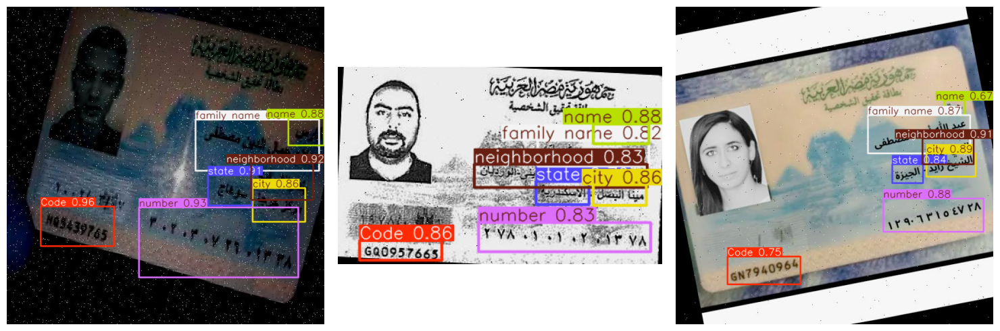

In [10]:
def visualize_samples(model,test_img_dir, num_samples=3):
    sample_files = np.random.choice(os.listdir(test_img_dir), num_samples)
    plt.figure(figsize=(15, 5))
    for i, img_file in enumerate(sample_files):
        img_path = os.path.join(test_img_dir, img_file)
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        results = model(img_path, verbose=False)

        plt.subplot(1, num_samples, i+1)
        plt.imshow(results[0].plot())  # YOLO's built-in visualization
        plt.axis('off')
    plt.tight_layout()
    plt.show()

front_test_img_dir = "/content/drive/MyDrive/tasks/data/Line_Detection_data/front/test/images"
visualize_samples(front_lines_model,front_test_img_dir, 3)

# Back ID Text Lines Detection

Data used for Back ID lines detection model:
- Train: 50
- validation: 2

Each label file contains 7 classes:
* 0: 'back_id'
* 1: 'job1'
* 2: 'job2'
* 3: 'gender'
* 4: 'religion'
* 5: 'marital_status'
* 6: 'exp_date'

Due to the unavailability of pre-labeled datasets for text line detection on the back side of Egyptian National ID (ENID) cards, manual annotation was required. Using the VoTT (Visual Object Tagging Tool) software.

## Training

In [ ]:
# Un-comment to start training the model
# back_lines_model = YOLO('./yolo_models/yolo11n.pt')

# back_lines_model.train(data='./data/Line_Detection_data/data.yaml', epochs=100, imgsz=640)

## Testing & Evaluation

In [83]:
# Load model
back_lines_model = YOLO('./resources/back_line_det_best.pt')

In [87]:
class_names = ['back_id','job1','job2','gender','religion','marital_status','exp_date']
metrics = back_lines_model.val(
    data="./data/Line_Detection_data/back/data.yaml",
    split="val",
    iou=0.)

print("\n------------------------------------------------------------------")
print(f"mAP@50: {float(metrics.box.map50):.4f}")        # mAP at IoU=0.5
print(f"mAP@50-95: {float(metrics.box.map):.4f}")       # Average mAP over IoU 0.5-0.95

print(f"Mean Precision: {float(metrics.box.p.mean()):.4f}")  # Average precision
print(f"Mean Recall: {float(metrics.box.r.mean()):.4f}")     # Average recall

# Per-class metrics
print("\nPer-class mAP@50:")
for i, name in enumerate(back_lines_model.names.values()):
    print(f"{name}: {float(metrics.box.ap50[i]):.4f}")


Ultralytics 8.3.161  Python-3.12.1 torch-2.4.1+cpu CPU (11th Gen Intel Core(TM) i7-1165G7 2.80GHz)
val: Fast image access  (ping: 0.20.0 ms, read: 12.01.7 MB/s, size: 8.3 KB)


val: Scanning C:\Users\aosayed\Music\Tasks\Final_ENIDs\data\Line_Detection_data\back\val\labels... 2 images, 0 backgrou

val: New cache created: C:\Users\aosayed\Music\Tasks\Final_ENIDs\data\Line_Detection_data\back\val\labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<0


                   all          2         14      0.963      0.999      0.995      0.815
               back_id          2          2          1      0.991      0.995      0.748
                  job1          2          2      0.969          1      0.995      0.846
                  job2          2          2      0.936          1      0.995      0.822
                gender          2          2      0.935          1      0.995      0.699
              religion          2          2      0.959          1      0.995      0.895
        marital_status          2          2      0.959          1      0.995      0.846
              exp_date          2          2      0.981          1      0.995      0.847
Speed: 2.8ms preprocess, 77.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs\detect\val5

------------------------------------------------------------------
mAP@50: 0.9950
mAP@50-95: 0.8149
Mean Precision: 0.9627
Mean Recall: 0.9988

Per-class mAP@50:
back_id: